# Deep Learning: A Simple Example

- Let's get back to the Name Gender Classifier.

![](../images/keras-workflow.png)

## Prepare Data

In [1]:
## Packages Dependencies
import os
import shutil
import numpy as np
import nltk
from nltk.corpus import names
import random

from sklearn.model_selection import train_test_split
from sklearn.manifold import TSNE

import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib

matplotlib.rcParams['figure.dpi'] = 150
    
from lime.lime_text import LimeTextExplainer

import tensorflow as tf
import tensorflow.keras as keras

from keras.preprocessing.text import Tokenizer
from keras.preprocessing import sequence
from keras.utils import to_categorical, plot_model
from keras.models import Sequential
from keras import layers
    # from keras.layers import Dense
    # from keras.layers import LSTM, RNN, GRU
    # from keras.layers import Embedding
    # from keras.layers import SpatialDropout1D

import kerastuner

In [2]:
labeled_names = ([(name, 1) for name in names.words('male.txt')] +
                 [(name, 0) for name in names.words('female.txt')])
random.shuffle(labeled_names)

## Train-Test Split

In [3]:
train_set, test_set = train_test_split(labeled_names,
                                       test_size=0.2,
                                       random_state=42)
print(len(train_set), len(test_set))

6355 1589


In [4]:
names = [n for (n, l) in train_set] ## X
labels = [l for (n, l) in train_set] ## y

In [5]:
len(names)

6355

## Tokenizer

- `keras.preprocessing.text.Tokenizer` is a very useful tokenizer for text processing in deep learning.
- `Tokenizer` assumes that the **word tokens** of the input texts have been delimited by whitespaces.
- `Tokenizer` provides the following functions:
    - It will first create a dictionary for the entire corpus (a mapping of each word token and its unique integer index index) (`Tokenizer.fit_on_text()`)
    - It can then use the corpus dictionary to convert **words** in each corpus text into **integer sequences** (`Tokenizer.texts_to_sequences()`)
    - The dictionary is in `Tokenizer.word_index`

- Notes on `Tokenizer`:
    - By default, the token index 0 is reserved for **padding token**.
    - If `oov_token` is specified, it is default to index 1. (Default: `oov_token=False`)
    - Specify `num_words=N` for `Tokenizer` to include only top N words in converting texts to sequences.
    - `Tokenizer` will automatically remove punctuations.
    - `Tokenizer` use the **whitespace** as word-token delimiter.
    - If every character is treated as a token, specify `char_level=True`.
    - Please read `Tokenizer` documentation very carefully. Very important!!

In [6]:
tokenizer = Tokenizer(char_level=True)
tokenizer.fit_on_texts(names) ## similar to CountVectorizer.fit_transform()

### Vocabulary

After we `Tokenizer.fit_on_texts()`, we can take a look at the corpus dictionary, i.e., the mapping of words and their unique integer indices.

In [7]:
# determine the vocabulary size
vocab_size = len(tokenizer.word_index) + 1
print('Vocabulary Size: %d' % vocab_size)

Vocabulary Size: 30


In [8]:
tokenizer.word_index

{'a': 1,
 'e': 2,
 'i': 3,
 'n': 4,
 'r': 5,
 'l': 6,
 'o': 7,
 't': 8,
 's': 9,
 'd': 10,
 'y': 11,
 'm': 12,
 'h': 13,
 'c': 14,
 'b': 15,
 'u': 16,
 'g': 17,
 'k': 18,
 'j': 19,
 'v': 20,
 'f': 21,
 'p': 22,
 'w': 23,
 'z': 24,
 'x': 25,
 'q': 26,
 '-': 27,
 ' ': 28,
 "'": 29}

## Prepare Input and Output Tensors

- Like in feature-based machine translation, a computational model only accepts numeric values. It is necessary to convert raw texts to numeric tensors for neural network.
- After we create the `Tokenizer`, we use the `Tokenizer` to perform text vectorization, i.e., converting texts into tensors.
- In deep learning, words or characters are automatically converted into numeric representations. In other words, the feature engineering step is fully automatic.

### Two Ways of Text Vectorization

- Texts to Sequences:
    - For each text, we convert all word tokens into **integer sequences**.
    - These integer sequences will then be transformed into **embeddings** in the deep learning network.
    - These embeddings are usually the basis for deep learning sequence models (i.e., RNN).
- Texts to Matrix: 
    - For each text, we vectorize the entire text into a vector of bag-of-words representation.
    - A **One-hot encoding** of the entire text would have all values of the text vector to be either 0 or 1, indicating the occurrence of all the words in the dictionary.
    - We can of course use the frequency-based bag-of-words representation (similar to `CountVectorizer()`).


## Method 1: Text to Sequences

### From Texts and Sequences

- We can convert our corpus texts into integer sequences using `Tokenizer.texts_to_sequences()`.
- Because texts vary in lengths, we use `keras.preprocessing.sequence.pad_sequence()` to pad all texts into a uniform length.
- This step is important. This ensures that every text, when pushed into the network, has exactly the same **tensor shape**.

In [9]:
names_ints = tokenizer.texts_to_sequences(names)

In [10]:
print(names[:5])
print(names_ints[:5])
print(labels[:5])

['Chanda', 'Sibley', 'Barbabra', 'Sherwin', 'Ginni']
[[14, 13, 1, 4, 10, 1], [9, 3, 15, 6, 2, 11], [15, 1, 5, 15, 1, 15, 5, 1], [9, 13, 2, 5, 23, 3, 4], [17, 3, 4, 4, 3]]
[0, 0, 0, 1, 0]


### Padding

- When padding the all texts into uniform lengths, consider whether to Pre-padding or removing values from the beginning of the sequence (i.e., `pre`) or the other way (`post`).
- Check `padding` and `truncating` parameters in `pad_sequences`
- In this tutorial, we first identify the longest name, and use its length as the `max_len` and pad all names into the `max_len`.

Helen-Elizabeth


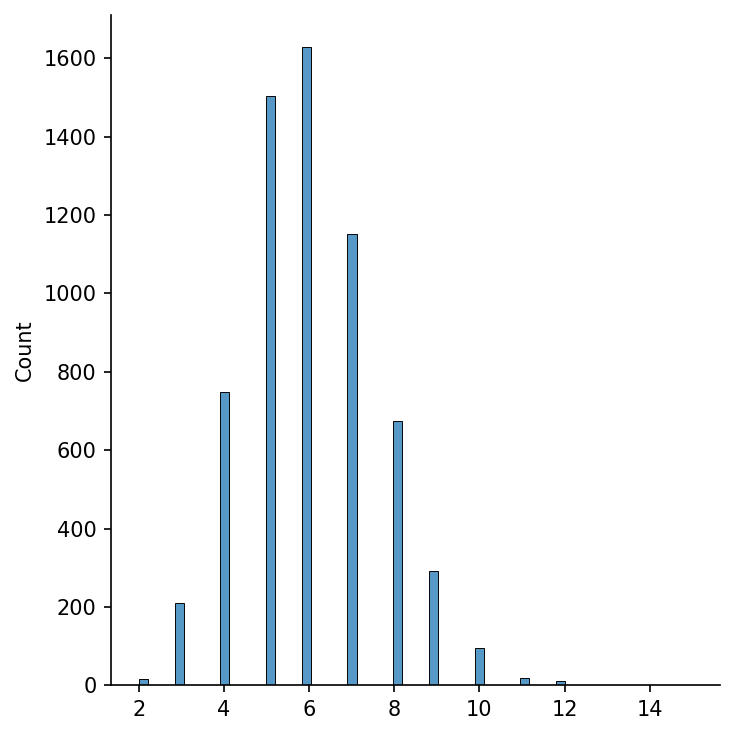

In [11]:
## We can check the length distribution of texts in corpus

names_lens = [len(n) for n in names_ints]
names_lens

sns.displot(names_lens)
print(names[np.argmax(names_lens)])  # longest name

In [12]:
max_len = names_lens[np.argmax(names_lens)]
max_len

15

In [13]:
names_ints_pad = sequence.pad_sequences(names_ints, maxlen=max_len)
names_ints_pad[:10]

array([[ 0,  0,  0,  0,  0,  0,  0,  0,  0, 14, 13,  1,  4, 10,  1],
       [ 0,  0,  0,  0,  0,  0,  0,  0,  0,  9,  3, 15,  6,  2, 11],
       [ 0,  0,  0,  0,  0,  0,  0, 15,  1,  5, 15,  1, 15,  5,  1],
       [ 0,  0,  0,  0,  0,  0,  0,  0,  9, 13,  2,  5, 23,  3,  4],
       [ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0, 17,  3,  4,  4,  3],
       [ 0,  0,  0,  0,  0,  0,  0,  0, 23,  3,  6, 15,  2,  5,  8],
       [ 0,  0,  0,  0,  0,  0,  0,  0,  0, 22,  1, 12, 12,  3,  2],
       [ 0,  0,  0,  0,  0,  0,  0,  0,  0,  8,  7,  5,  5,  2, 11],
       [ 0,  0,  0,  0,  0,  0,  0, 14, 13,  5,  3,  9,  8,  3,  2],
       [ 0,  0,  0,  0,  0,  0,  0,  0,  0,  6,  1, 23,  8,  7,  4]],
      dtype=int32)

### Define X and Y

- So for names, we convert names into integer sequences, and pad them into the uniform length.
- We perform exactly the same processing to the names in test data.
- We convert both the names (X) and labels (y) into `numpy.array`.

In [14]:
## training data
X_train = np.array(names_ints_pad).astype('int32')
y_train = np.array(labels)


## testing data
X_test_texts = [n for (n, l) in test_set]
X_test = np.array(
    sequence.pad_sequences(tokenizer.texts_to_sequences(X_test_texts),
                           maxlen=max_len)).astype('int32')
y_test = np.array([l for (n, l) in test_set])

In [15]:
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(6355, 15)
(6355,)
(1589, 15)
(1589,)


## Method 2: Text to Matrix

### One-Hot Encoding (Bag-of-Words)

- We can convert each text to a bag-of-words vector using `Tokenzier.texts_to_matrix()`.
- In particular, we can specify the parameter `mode`: `binary`, `count`, or `tfidf`.
- When the `mode="binary"`, the text vector is a one-hot encoding vector, indicating whether a character occurs in the text or not.

In [16]:
names_matrix = tokenizer.texts_to_matrix(names, mode="binary")
print(names_matrix.shape)

(6355, 30)


In [17]:
print(names[2])
print(names_matrix[2,:])

Barbabra
[0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0.]


In [18]:
tokenizer.word_index

{'a': 1,
 'e': 2,
 'i': 3,
 'n': 4,
 'r': 5,
 'l': 6,
 'o': 7,
 't': 8,
 's': 9,
 'd': 10,
 'y': 11,
 'm': 12,
 'h': 13,
 'c': 14,
 'b': 15,
 'u': 16,
 'g': 17,
 'k': 18,
 'j': 19,
 'v': 20,
 'f': 21,
 'p': 22,
 'w': 23,
 'z': 24,
 'x': 25,
 'q': 26,
 '-': 27,
 ' ': 28,
 "'": 29}

### Define X and Y

In [19]:
X_train2 = np.array(names_matrix).astype('int32')
y_train2 = np.array(labels)

X_test2 = tokenizer.texts_to_matrix(X_test_texts,
                                    mode="binary").astype('int32')
y_test2 = np.array([l for (n, l) in test_set])

In [20]:
print(X_train2.shape)
print(y_train2.shape)
print(X_test2.shape)
print(y_test2.shape)

(6355, 30)
(6355,)
(1589, 30)
(1589,)


## Model Definition

- Three important steps for building a deep neural network:
    - **Define** the model structure 
    - **Compile** the model
    - **Fit** the model

- After we have defined our input and output tensors (X and y), we can define the architecture of our neural network model.
- For the two ways of name vectorized representations, we try two different types of networks.
    - Text to Matrix: Fully connected Dense Layers
    - Text to Sequences: Embedding + RNN


In [21]:
# Two Versions of Plotting Functions for `history` from `model.fit()`
def plot1(history):
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    loss = history.history['loss']
    val_loss = history.history['val_loss']

    epochs = range(1, len(acc) + 1)
    ## Accuracy plot
    plt.plot(epochs, acc, 'bo', label='Training acc')
    plt.plot(epochs, val_acc, 'b', label='Validation acc')
    plt.title('Training and validation accuracy')
    plt.legend()
    ## Loss plot
    plt.figure()

    plt.plot(epochs, loss, 'bo', label='Training loss')
    plt.plot(epochs, val_loss, 'b', label='Validation loss')
    plt.title('Training and validation loss')
    plt.legend()
    plt.show()


def plot2(history):
    pd.DataFrame(history.history).plot(figsize=(8, 5))
    plt.grid(True)
    #plt.gca().set_ylim(0,1)
    plt.show()

### Model 1: Fully Connected Dense Layers

- Let's try a simple neural network with two fully-connected dense layers with the Text-to-Matrix inputs.
- That is, the input of this model is the bag-of-words representation of the entire name.

![](../images/name-gender-classifier-dl/name-gender-classifier-dl.002.jpeg)

#### Dense Layer Operation

- The transformation of each Dense layer will transform the input tensor into a tensor whose dimension size is the same as the node number of the Dense layer.

![](../images/name-gender-classifier-dl/name-gender-classifier-dl.003.jpeg)

In [22]:
## Define Model
model1 = keras.Sequential()
model1.add(keras.Input(shape=(vocab_size, ), name="one_hot_input"))
model1.add(layers.Dense(16, activation="relu", name="dense_layer_1"))
model1.add(layers.Dense(16, activation="relu", name="dense_layer_2"))
model1.add(layers.Dense(1, activation="sigmoid", name="output"))

In [23]:
## Compile Model
model1.compile(loss=keras.losses.BinaryCrossentropy(),
               optimizer=keras.optimizers.Adam(lr=0.001),
               metrics=["accuracy"])

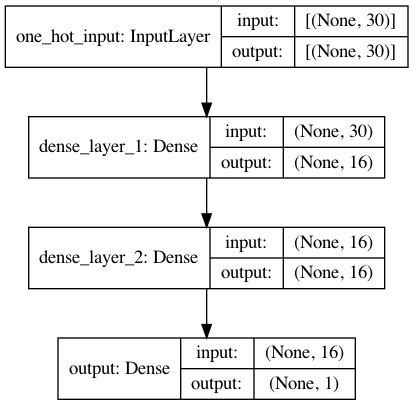

In [24]:
plot_model(model1, show_shapes=True)

#### A few hyperparameters for network training

- Batch Size: The number of inputs needed per update of the model parameter (gradient descent)
- Epoch: How many iterations needed for training
- Validation Split Ratio: Proportion of validation and training data split

In [25]:
## Hyperparameters
BATCH_SIZE = 128
EPOCHS = 20
VALIDATION_SPLIT = 0.2

In [26]:
## Fit the model
history1 = model1.fit(X_train2,
                      y_train2,
                      batch_size=BATCH_SIZE,
                      epochs=EPOCHS,
                      verbose=2,
                      validation_split=VALIDATION_SPLIT)

Epoch 1/20
40/40 - 2s - loss: 0.6717 - accuracy: 0.6279 - val_loss: 0.6774 - val_accuracy: 0.6121
Epoch 2/20
40/40 - 0s - loss: 0.6582 - accuracy: 0.6279 - val_loss: 0.6676 - val_accuracy: 0.6121
Epoch 3/20
40/40 - 0s - loss: 0.6468 - accuracy: 0.6298 - val_loss: 0.6569 - val_accuracy: 0.6145
Epoch 4/20
40/40 - 0s - loss: 0.6334 - accuracy: 0.6379 - val_loss: 0.6426 - val_accuracy: 0.6271
Epoch 5/20
40/40 - 0s - loss: 0.6176 - accuracy: 0.6621 - val_loss: 0.6256 - val_accuracy: 0.6475
Epoch 6/20
40/40 - 0s - loss: 0.6018 - accuracy: 0.6817 - val_loss: 0.6135 - val_accuracy: 0.6648
Epoch 7/20
40/40 - 0s - loss: 0.5914 - accuracy: 0.6937 - val_loss: 0.6061 - val_accuracy: 0.6743
Epoch 8/20
40/40 - 0s - loss: 0.5827 - accuracy: 0.6996 - val_loss: 0.6012 - val_accuracy: 0.6814
Epoch 9/20
40/40 - 0s - loss: 0.5767 - accuracy: 0.7022 - val_loss: 0.5976 - val_accuracy: 0.6924
Epoch 10/20
40/40 - 0s - loss: 0.5727 - accuracy: 0.7042 - val_loss: 0.5948 - val_accuracy: 0.6955
Epoch 11/20
40/40 -

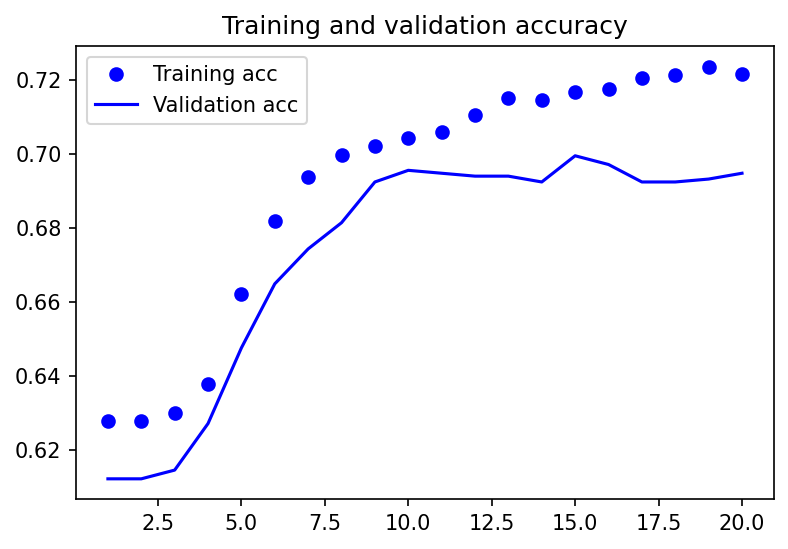

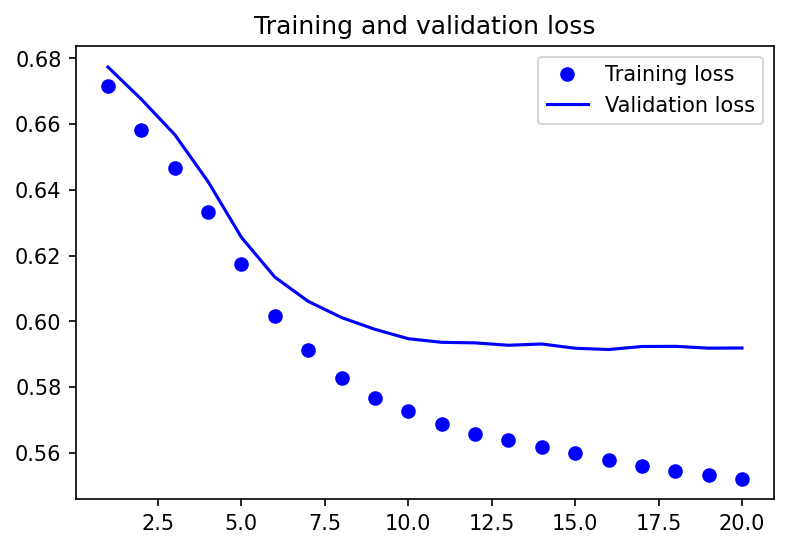

In [27]:
plot1(history1)

In [28]:
model1.evaluate(X_test2, y_test2, batch_size=128, verbose=2)

13/13 - 0s - loss: 0.5515 - accuracy: 0.7181


[0.5515258312225342, 0.7180616855621338]

### Model 2: Embedding + RNN

- Another possibility is to introduce an embedding layer in the network, which transforms each **character** in the name into a tensor (i.e., embeddings), and then to add a Recurrent Neural Network layer to process each character sequentially.
- The strength of the RNN is that it iterates over the **timesteps** of a sequence, while maintaining an internal state that encodes information about the **timesteps** it has seen so far.
- It is posited that after the RNN iterates through the entire sequence, it keeps important information of all previously iterated tokens for further operation.
- The input of this network is a padded sequence of the original text (name).

![](../images/name-gender-classifier-dl/name-gender-classifier-dl.004.jpeg)

In [29]:
## Define the embedding dimension
EMBEDDING_DIM = 128

## Define model
model2 = Sequential()
model2.add(
    layers.Embedding(input_dim=vocab_size,
                     output_dim=EMBEDDING_DIM,
                     input_length=max_len,
                     mask_zero=True))
model2.add(layers.SimpleRNN(16, activation="relu", name="RNN_layer"))
model2.add(layers.Dense(16, activation="relu", name="dense_layer"))
model2.add(layers.Dense(1, activation="sigmoid", name="output"))

model2.compile(loss=keras.losses.BinaryCrossentropy(),
               optimizer=keras.optimizers.Adam(lr=0.001),
               metrics=["accuracy"])

#### Embedding Layer Operation

![](../images/name-gender-classifier-dl/name-gender-classifier-dl.005.jpeg)

#### RNN Layer Operation

![](../images/name-gender-classifier-dl/name-gender-classifier-dl.006.jpeg)

#### RNN Layer Operation

![](../images/name-gender-classifier-dl/name-gender-classifier-dl.007.jpeg)

#### Unrolled Version of RNN Operation

![](../images/name-gender-classifier-dl/name-gender-classifier-dl.008.jpeg)

#### Unrolled Version of RNN Operation

![](../images/name-gender-classifier-dl/name-gender-classifier-dl.009.jpeg)

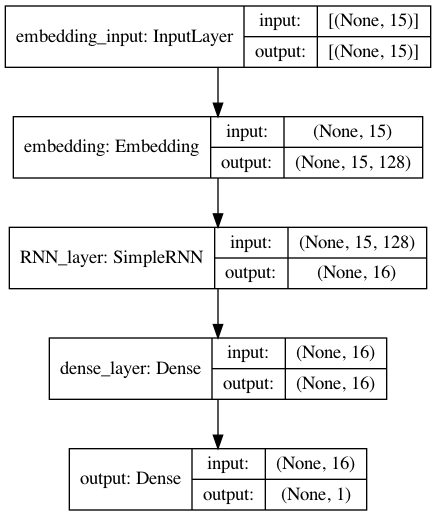

In [30]:
plot_model(model2, show_shapes=True)

In [31]:
history2 = model2.fit(X_train,
                      y_train,
                      batch_size=BATCH_SIZE,
                      epochs=EPOCHS,
                      verbose=2,
                      validation_split=VALIDATION_SPLIT)

Epoch 1/20
40/40 - 2s - loss: 0.6078 - accuracy: 0.6898 - val_loss: 0.5463 - val_accuracy: 0.7089
Epoch 2/20
40/40 - 0s - loss: 0.4753 - accuracy: 0.7707 - val_loss: 0.4726 - val_accuracy: 0.7569
Epoch 3/20
40/40 - 0s - loss: 0.4303 - accuracy: 0.7886 - val_loss: 0.4529 - val_accuracy: 0.7836
Epoch 4/20
40/40 - 0s - loss: 0.4119 - accuracy: 0.7994 - val_loss: 0.4458 - val_accuracy: 0.7884
Epoch 5/20
40/40 - 0s - loss: 0.4021 - accuracy: 0.8118 - val_loss: 0.4410 - val_accuracy: 0.7860
Epoch 6/20
40/40 - 0s - loss: 0.3963 - accuracy: 0.8141 - val_loss: 0.4386 - val_accuracy: 0.7852
Epoch 7/20
40/40 - 0s - loss: 0.3859 - accuracy: 0.8161 - val_loss: 0.4385 - val_accuracy: 0.7884
Epoch 8/20
40/40 - 0s - loss: 0.3813 - accuracy: 0.8224 - val_loss: 0.4352 - val_accuracy: 0.7923
Epoch 9/20
40/40 - 0s - loss: 0.3771 - accuracy: 0.8245 - val_loss: 0.4342 - val_accuracy: 0.7923
Epoch 10/20
40/40 - 0s - loss: 0.3728 - accuracy: 0.8253 - val_loss: 0.4339 - val_accuracy: 0.7907
Epoch 11/20
40/40 -

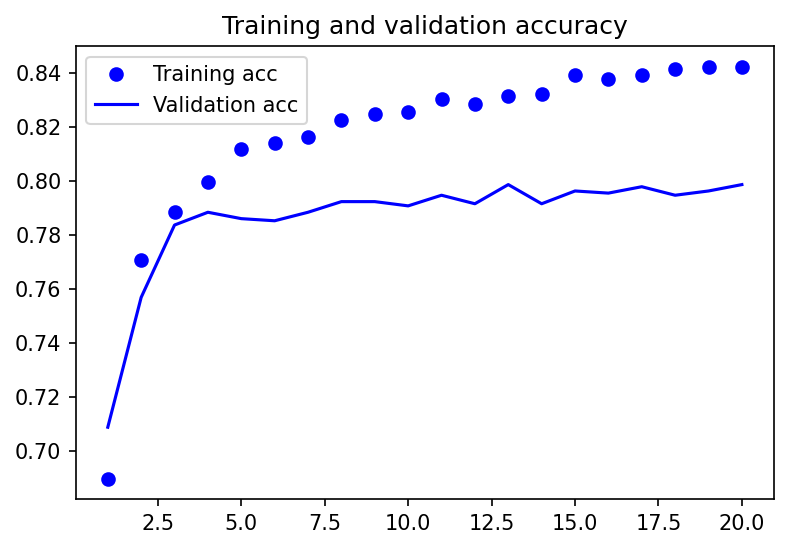

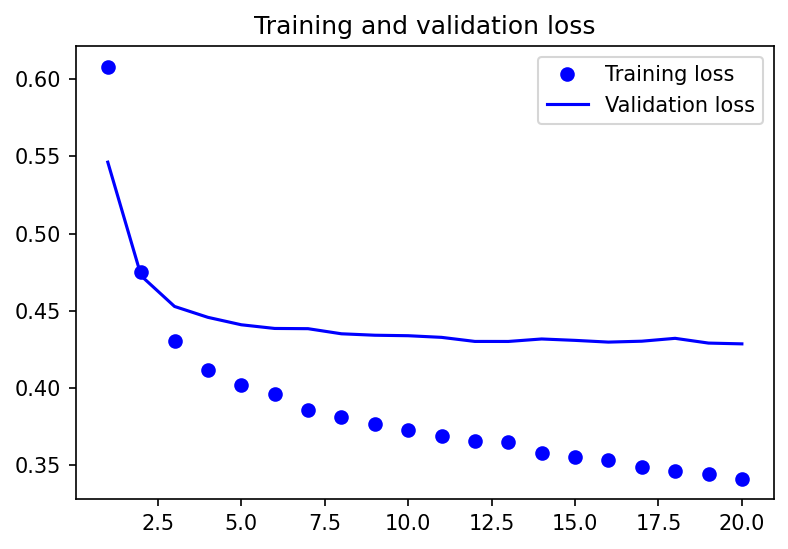

In [32]:
plot1(history2)

In [33]:
model2.evaluate(X_test, y_test, batch_size=128, verbose=2)

13/13 - 0s - loss: 0.4266 - accuracy: 0.7911


[0.4266381561756134, 0.7910635471343994]

### Model 3: Regularization and Dropout

- Based on the validation results of the previous two models (esp. the RNN-based model), we can see that they are probably a bit overfit because the model performance on the validation set starts to stall after the first few epochs.
- We can add **regularization** and **dropouts** in our network definition to avoid overfitting.

In [34]:
## Define embedding dimension
EMBEDDING_DIM = 128

## Define model
model3 = Sequential()
model3.add(
    layers.Embedding(input_dim=vocab_size,
                     output_dim=EMBEDDING_DIM,
                     input_length=max_len,
                     mask_zero=True))
model3.add(
    layers.SimpleRNN(16,
                     activation="relu",
                     name="RNN_layer",
                     dropout=0.2, ## dropout for input character
                     recurrent_dropout=0.2))  ## dropout for previous state
model3.add(layers.Dense(16, activation="relu", name="dense_layer"))
model3.add(layers.Dense(1, activation="sigmoid", name="output"))

model3.compile(loss=keras.losses.BinaryCrossentropy(),
               optimizer=keras.optimizers.Adam(lr=0.001),
               metrics=["accuracy"])

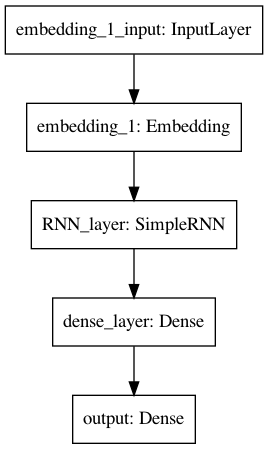

In [35]:
plot_model(model3)

In [36]:
history3 = model3.fit(X_train,
                      y_train,
                      batch_size=BATCH_SIZE,
                      epochs=EPOCHS,
                      verbose=2,
                      validation_split=VALIDATION_SPLIT)

Epoch 1/20
40/40 - 2s - loss: 0.6603 - accuracy: 0.6882 - val_loss: 0.6119 - val_accuracy: 0.7097
Epoch 2/20
40/40 - 0s - loss: 0.5424 - accuracy: 0.7476 - val_loss: 0.5103 - val_accuracy: 0.7388
Epoch 3/20
40/40 - 0s - loss: 0.4676 - accuracy: 0.7734 - val_loss: 0.4780 - val_accuracy: 0.7695
Epoch 4/20
40/40 - 1s - loss: 0.4499 - accuracy: 0.7728 - val_loss: 0.4729 - val_accuracy: 0.7718
Epoch 5/20
40/40 - 0s - loss: 0.4435 - accuracy: 0.7797 - val_loss: 0.4655 - val_accuracy: 0.7742
Epoch 6/20
40/40 - 0s - loss: 0.4383 - accuracy: 0.7886 - val_loss: 0.4591 - val_accuracy: 0.7671
Epoch 7/20
40/40 - 0s - loss: 0.4356 - accuracy: 0.7836 - val_loss: 0.4586 - val_accuracy: 0.7789
Epoch 8/20
40/40 - 0s - loss: 0.4288 - accuracy: 0.7909 - val_loss: 0.4506 - val_accuracy: 0.7742
Epoch 9/20
40/40 - 0s - loss: 0.4252 - accuracy: 0.7935 - val_loss: 0.4483 - val_accuracy: 0.7773
Epoch 10/20
40/40 - 0s - loss: 0.4237 - accuracy: 0.7952 - val_loss: 0.4483 - val_accuracy: 0.7797
Epoch 11/20
40/40 -

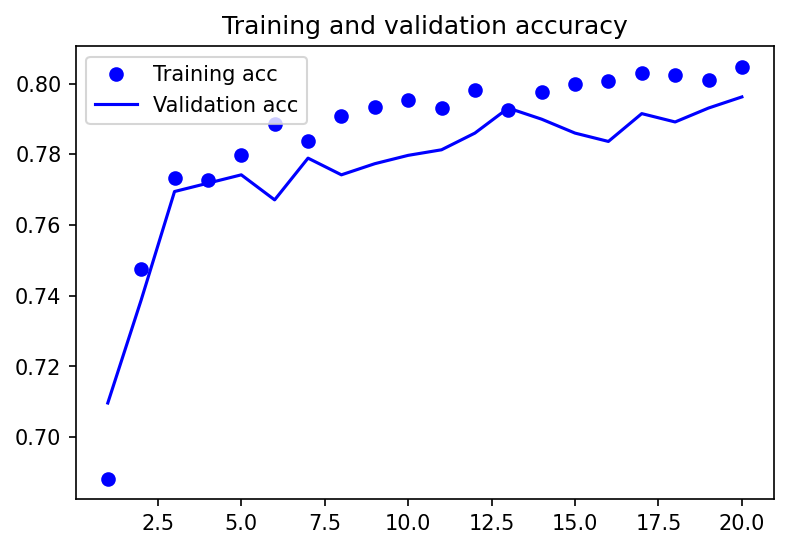

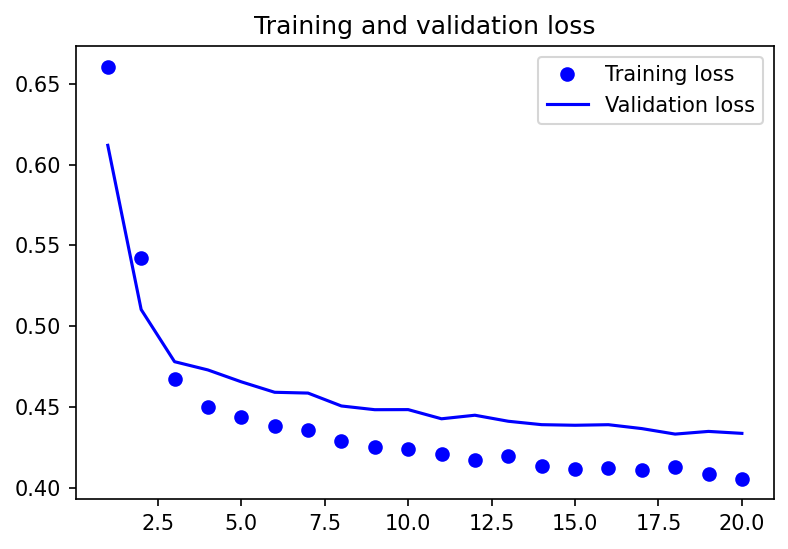

In [37]:
plot1(history3)

In [38]:
model3.evaluate(X_test, y_test, batch_size=128, verbose=2)

13/13 - 0s - loss: 0.4313 - accuracy: 0.7867


[0.4312911629676819, 0.7866582870483398]

### Model 4: Improve the Models

- In addition to regularization and dropouts, we can further improve the model by increasing the model **complexity**.
- In particular, we can increase the **depths** and **widths** of the network layers.
- Let's try stacking two RNN layers.

:::{tip}

When we stack two sequence layers (e.g., RNN), we need to make sure that the hidden states (outputs) of the first sequence layer at **all timesteps** are properly passed onto the next sequence layer, not just the hidden state (output) of the last timestep.

In keras, this usually means that we need to set the argument `return_sequences=True` in a sequence layer (e.g., `SimpleRNN`, `LSTM`, `GRU` etc).

:::

In [39]:
## Define embedding dimension
MBEDDING_DIM = 128

## Define model
model4 = Sequential()
model4.add(
    layers.Embedding(input_dim=vocab_size,
                     output_dim=EMBEDDING_DIM,
                     input_length=max_len,
                     mask_zero=True))
model4.add(
    layers.SimpleRNN(16,
                     activation="relu",
                     name="RNN_layer_1",
                     dropout=0.2,
                     recurrent_dropout=0.2,
                     return_sequences=True) 
)  ## To ensure the hidden states of all timesteps are pased down to next layer
model4.add(
    layers.SimpleRNN(16,
                     activation="relu",
                     name="RNN_layer_2",
                     dropout=0.2,
                     recurrent_dropout=0.2))
model4.add(layers.Dense(1, activation="sigmoid", name="output"))

## Compile model
model4.compile(loss=keras.losses.BinaryCrossentropy(),
               optimizer=keras.optimizers.Adam(lr=0.001),
               metrics=["accuracy"])

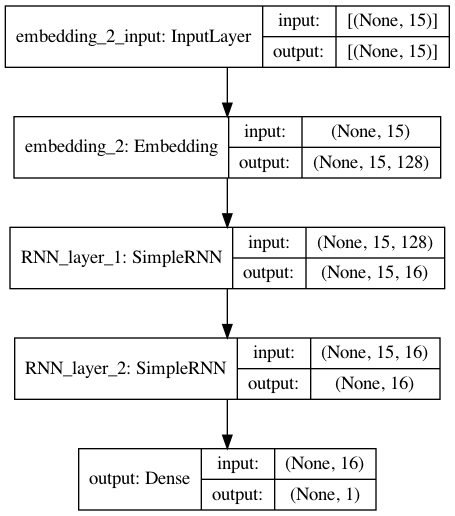

In [40]:
plot_model(model4, show_shapes=True)

In [41]:
history4 = model4.fit(X_train,
                      y_train,
                      batch_size=BATCH_SIZE,
                      epochs=EPOCHS,
                      verbose=2,
                      validation_split=VALIDATION_SPLIT)

Epoch 1/20
40/40 - 4s - loss: 0.6493 - accuracy: 0.6239 - val_loss: 0.6130 - val_accuracy: 0.6310
Epoch 2/20
40/40 - 0s - loss: 0.5805 - accuracy: 0.6951 - val_loss: 0.5246 - val_accuracy: 0.7223
Epoch 3/20
40/40 - 1s - loss: 0.5190 - accuracy: 0.7425 - val_loss: 0.4749 - val_accuracy: 0.7710
Epoch 4/20
40/40 - 0s - loss: 0.4791 - accuracy: 0.7685 - val_loss: 0.4595 - val_accuracy: 0.7797
Epoch 5/20
40/40 - 1s - loss: 0.4658 - accuracy: 0.7754 - val_loss: 0.4553 - val_accuracy: 0.7852
Epoch 6/20
40/40 - 0s - loss: 0.4602 - accuracy: 0.7742 - val_loss: 0.4517 - val_accuracy: 0.7844
Epoch 7/20
40/40 - 0s - loss: 0.4493 - accuracy: 0.7744 - val_loss: 0.4484 - val_accuracy: 0.7884
Epoch 8/20
40/40 - 0s - loss: 0.4447 - accuracy: 0.7799 - val_loss: 0.4501 - val_accuracy: 0.7844
Epoch 9/20
40/40 - 0s - loss: 0.4395 - accuracy: 0.7891 - val_loss: 0.4470 - val_accuracy: 0.7876
Epoch 10/20
40/40 - 0s - loss: 0.4370 - accuracy: 0.7931 - val_loss: 0.4410 - val_accuracy: 0.7954
Epoch 11/20
40/40 -

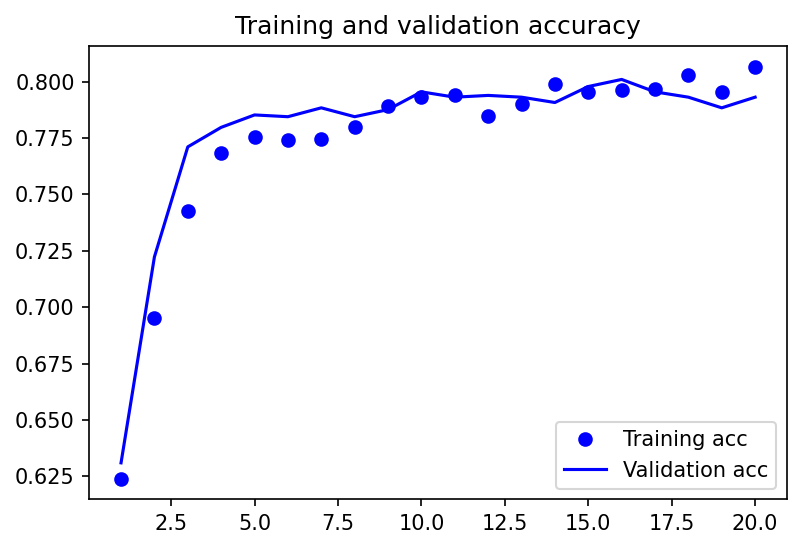

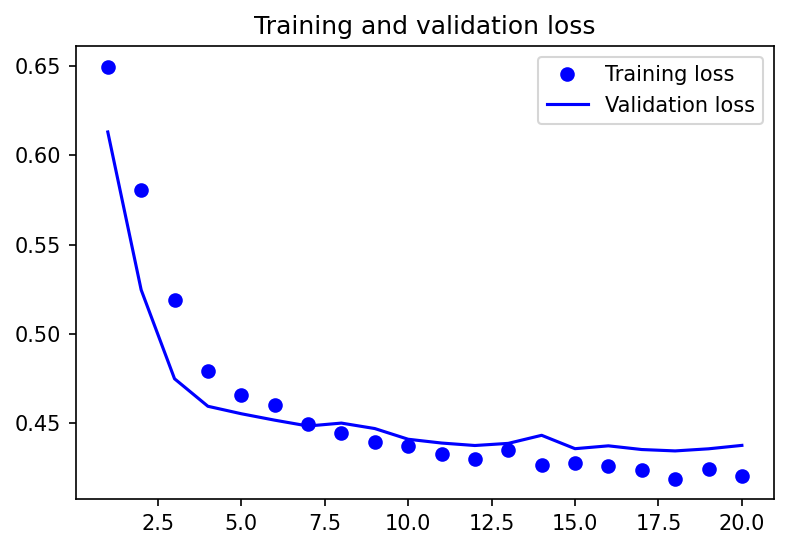

In [42]:
plot1(history4)

In [43]:
model4.evaluate(X_test, y_test, batch_size=128, verbose=2)

13/13 - 0s - loss: 0.4272 - accuracy: 0.7904


[0.4271852970123291, 0.7904342412948608]

### Model 5: Bidirectional

- We can also increase the model complexity in at least two possible ways:
    - Use more advanced RNNs, such as LSTM or GRU
    - Process the sequence in two directions
    - Increase the hidden nodes of the RNN/LSTM
- Now let's try the more sophisticated RNN, LSTM, and with bidirectional sequence processing and add more nodes to the LSTM layer.

In [44]:
## Define embedding dimension
EMBEDDING_DIM = 128

## Define model
model5 = Sequential()
model5.add(
    layers.Embedding(input_dim=vocab_size,
                      output_dim=EMBEDDING_DIM,
                      input_length=max_len,
                      mask_zero=True))
model5.add(
    layers.Bidirectional(  ## Bidirectional sequence processing
        layers.LSTM(32,
                    activation="relu",
                    name="lstm_layer_1",
                    dropout=0.2,
                    recurrent_dropout=0.5,
                    return_sequences=True)))
model5.add(
    layers.Bidirectional(  ## Bidirectional sequence processing
        layers.LSTM(32,
                    activation="relu",
                    name="lstm_layer_2",
                    dropout=0.2,
                    recurrent_dropout=0.5)))
model5.add(layers.Dense(1, activation="sigmoid", name="output"))

model5.compile(loss=keras.losses.BinaryCrossentropy(),
               optimizer=keras.optimizers.Adam(lr=0.001),
               metrics=["accuracy"])

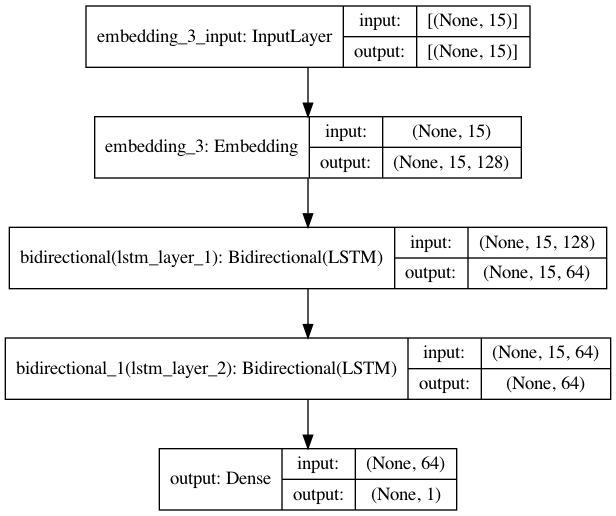

In [45]:
plot_model(model5, show_shapes=True)

In [46]:
history5 = model5.fit(X_train,
                      y_train,
                      batch_size=BATCH_SIZE,
                      epochs=EPOCHS,
                      verbose=2,
                      validation_split=VALIDATION_SPLIT)

Epoch 1/20
40/40 - 16s - loss: 0.6629 - accuracy: 0.6220 - val_loss: 0.6377 - val_accuracy: 0.6121
Epoch 2/20
40/40 - 2s - loss: 0.5933 - accuracy: 0.6690 - val_loss: 0.5413 - val_accuracy: 0.7396
Epoch 3/20
40/40 - 2s - loss: 0.5076 - accuracy: 0.7455 - val_loss: 0.5043 - val_accuracy: 0.7655
Epoch 4/20
40/40 - 3s - loss: 0.4815 - accuracy: 0.7695 - val_loss: 0.4847 - val_accuracy: 0.7773
Epoch 5/20
40/40 - 2s - loss: 0.4662 - accuracy: 0.7730 - val_loss: 0.4731 - val_accuracy: 0.7821
Epoch 6/20
40/40 - 2s - loss: 0.4515 - accuracy: 0.7854 - val_loss: 0.4608 - val_accuracy: 0.7836
Epoch 7/20
40/40 - 2s - loss: 0.4423 - accuracy: 0.7817 - val_loss: 0.4554 - val_accuracy: 0.7836
Epoch 8/20
40/40 - 2s - loss: 0.4323 - accuracy: 0.7917 - val_loss: 0.4664 - val_accuracy: 0.7789
Epoch 9/20
40/40 - 2s - loss: 0.4277 - accuracy: 0.7929 - val_loss: 0.4445 - val_accuracy: 0.7844
Epoch 10/20
40/40 - 2s - loss: 0.4168 - accuracy: 0.7968 - val_loss: 0.4372 - val_accuracy: 0.7868
Epoch 11/20
40/40 

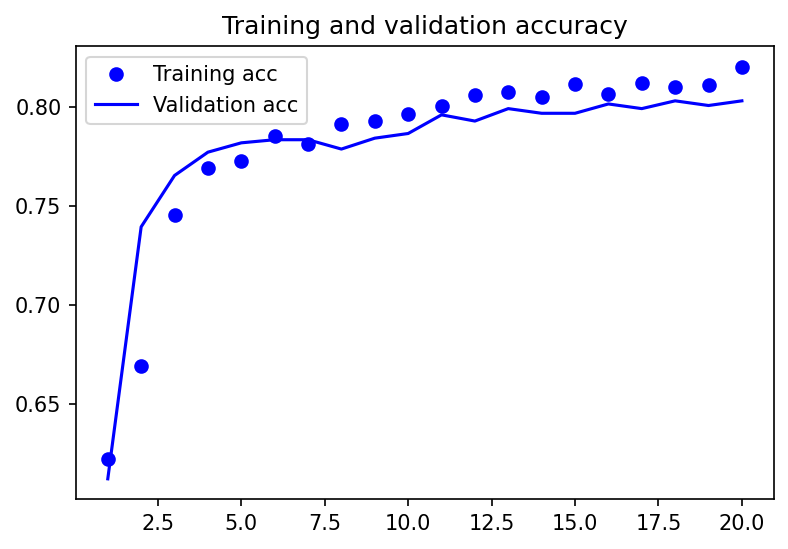

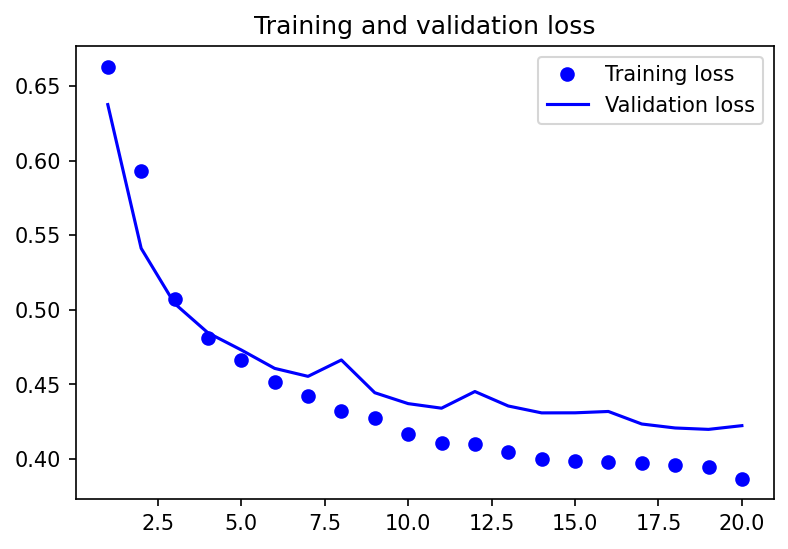

In [47]:
plot1(history5)

In [48]:
model5.evaluate(X_test, y_test, batch_size=128, verbose=2)

13/13 - 0s - loss: 0.4200 - accuracy: 0.8024


[0.4199684262275696, 0.8023914694786072]

## Check Embeddings

- Compared to one-hot encodings of characters, embeddings may include more information relating to the characteristics (semantics?) of the characters.
- We can extract the embedding layer and apply dimensional reduction techniques (i.e., TSNE) to see how embeddings capture the relationships in-between characters.

In [49]:
## A name in sequence from test set
print(X_test_texts[10])
print(X_test[10])

Erma
[ 0  0  0  0  0  0  0  0  0  0  0  2  5 12  1]


In [50]:
## Extract Corpus Dictionary (mapping of chars and integer indices)
ind2char = tokenizer.index_word
[ind2char.get(i) for i in X_test[10] if ind2char.get(i) != None]

['e', 'r', 'm', 'a']

In [51]:
## Extract the embedding layer (its weights matrix)
char_vectors = model5.layers[0].get_weights()[0]
print(char_vectors.shape) ## embedding shape (vocab_size, embed_dim)
print(char_vectors[1,:]) ## first char embeddings

(30, 128)
[-0.08638821  0.10196032 -0.08930968 -0.08678097 -0.09036665 -0.06538443
  0.06650709 -0.10806406  0.00168613 -0.07606699 -0.09379511 -0.05240235
 -0.06894766  0.01251148  0.23080757 -0.12168883 -0.11802603 -0.12854312
  0.12610877 -0.01837258 -0.08400774  0.06846871 -0.07555567 -0.07070152
 -0.08286686  0.10378125  0.09733976 -0.09550156  0.02652814  0.06678072
  0.09279401 -0.00279973 -0.14800397 -0.09717548 -0.02988891  0.20770137
 -0.10793544 -0.13713866 -0.10818603  0.05101357 -0.08654831 -0.10884775
  0.10200328 -0.05336187 -0.10099219  0.0701826   0.06384768  0.09715796
 -0.12641913 -0.06987549  0.09652784  0.03662771 -0.04180462 -0.04470819
 -0.1648816  -0.16170195  0.13866846  0.03711467 -0.18266453  0.12483152
  0.09363896 -0.07205503 -0.10150398  0.13476276 -0.09745233  0.12633258
  0.0910398   0.08862504 -0.19972621  0.07722508  0.1255034   0.14225055
  0.12625924  0.12086959 -0.09569547 -0.11019094  0.12148605 -0.09907743
  0.0770528  -0.10457225  0.19166091  0.1

In [52]:
labels = [char for (ind, char) in tokenizer.index_word.items()]
labels.insert(0, None)
labels

[None,
 'a',
 'e',
 'i',
 'n',
 'r',
 'l',
 'o',
 't',
 's',
 'd',
 'y',
 'm',
 'h',
 'c',
 'b',
 'u',
 'g',
 'k',
 'j',
 'v',
 'f',
 'p',
 'w',
 'z',
 'x',
 'q',
 '-',
 ' ',
 "'"]

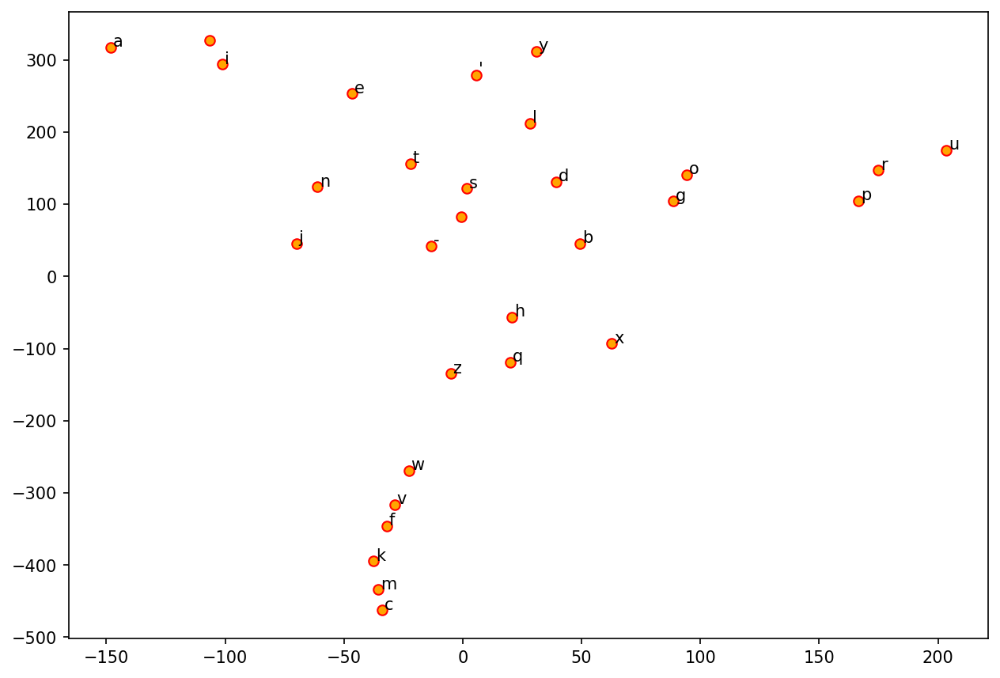

In [53]:
## Visulizing char embeddings via dimensional reduction techniques

tsne = TSNE(n_components=2, random_state=0, n_iter=5000, perplexity=3)
np.set_printoptions(suppress=True)

T = tsne.fit_transform(char_vectors)
labels = labels

plt.figure(figsize=(10, 7), dpi=150)
plt.scatter(T[:, 0], T[:, 1], c='orange', edgecolors='r')
for label, x, y in zip(labels, T[:, 0], T[:, 1]):
    plt.annotate(label,
                 xy=(x + 1, y + 1),
                 xytext=(0, 0),
                 textcoords='offset points')

## Issues of Word/Character Representations

- One-hot encoding does not indicate semantic relationships between characters.
- For deep learning NLP, it is preferred to convert one-hot encodings of words/characters into **embeddings**, which are argued to include more semantic information of the tokens.
- Now the question is how to train and create better word embeddings. 
- There are at least two alternatives:
    - We can train the embeddings along with our current NLP task.
    - We can use pre-trained embeddings from other unsupervised learning (transfer learning).
- We will come back to this issue later.

## Hyperparameter Tuning

:::{note}

Please install keras tuner module in your current conda:

```
pip install -U keras-tuner
```

or 

```
conda install -c conda-forge keras-tuner
```

:::

- Like feature-based ML methods, neural networks also come with many **hyperparameters**, which require default values.
- Typical hyperparameters include:
    - Number of nodes for the layer
    - Learning Rates
- We can utilize the module, [`keras-tuner`](https://keras-team.github.io/keras-tuner/documentation/tuners/), to fine-tune these hyperparameters (i.e., to find the values that optimize the model performance).

- Steps for Keras Tuner
    - First, wrap the model definition in a function, which takes a single `hp` argument. 
    - Inside this function, replace any value we want to tune with a call to hyperparameter sampling methods, e.g. `hp.Int()` or `hp.Choice()`. The function should return a compiled model.
    - Next, instantiate a `tuner` object specifying our optimization objective and other search parameters.
    - Finally, start the search with the `search()` method, which takes the same arguments as `Model.fit()` in keras.
    - When the search is over, we can retrieve the best model and a summary of the results from the `tunner`.


In [54]:
## confirm if the right kernel is being used
# import sys
# sys.executable

In [55]:
## Wrap model definition in a function
## and specify the parameters needed for tuning
# def build_model(hp):
#     model1 = keras.Sequential()
#     model1.add(keras.Input(shape=(max_len,)))
#     model1.add(layers.Dense(hp.Int('units', min_value=32, max_value=128, step=32), activation="relu", name="dense_layer_1"))
#     model1.add(layers.Dense(hp.Int('units', min_value=32, max_value=128, step=32), activation="relu", name="dense_layer_2"))
#     model1.add(layers.Dense(2, activation="softmax", name="output"))
#     model1.compile(
#         optimizer=keras.optimizers.Adam(
#             hp.Choice('learning_rate',
#                       values=[1e-2, 1e-3, 1e-4])),
#         loss='sparse_categorical_crossentropy',
#         metrics=['accuracy'])
#     return model1

In [56]:
## wrap model definition and compiling

def build_model(hp):
    m = Sequential()
    m.add(
        layers.Embedding(
            input_dim=vocab_size,
            output_dim=hp.Int(
                'output_dim',  ## tuning 2
                min_value=32,
                max_value=128,
                step=32),
            input_length=max_len,
            mask_zero=True))
    m.add(
        layers.Bidirectional(
            layers.LSTM(
                hp.Int('units', min_value=16, max_value=64,
                       step=16),  ## tuning 1
                activation="relu",
                dropout=0.2,
                recurrent_dropout=0.2)))
    m.add(layers.Dense(1, activation="sigmoid", name="output"))

    m.compile(loss=keras.losses.BinaryCrossentropy(),
              optimizer=keras.optimizers.Adam(lr=0.001),
              metrics=["accuracy"])
    return m

In [57]:
## This is to clean up the temp dir from the tuner
## Every time we re-start the tunner, it's better to keep the temp dir clean

if os.path.isdir('my_dir'):
    shutil.rmtree('my_dir')

- The `max_trials` variable represents the maximum number of trials that a hyperparameter combination would run.
- The `execution_per_trial` variable is the number of models that should be built and fit for each trial for robustness purposes.

In [58]:
## Instantiate the tunner

tuner = kerastuner.tuners.RandomSearch(build_model,
                                       objective='val_accuracy',
                                       max_trials=10,
                                       executions_per_trial=2,
                                       directory='my_dir')

In [59]:
## Check the tuner's search space
tuner.search_space_summary()

In [60]:
%%time
## Start tuning with the tuner
tuner.search(X_train, y_train, validation_split=0.2, batch_size=128)

40/40 [==============================] - ETA: 3:47 - loss: 0.6913 - accuracy: 0.71 - ETA: 1s - loss: 0.6904 - accuracy: 0.6966 - ETA: 1s - loss: 0.6899 - accuracy: 0.68 - ETA: 1s - loss: 0.6893 - accuracy: 0.67 - ETA: 1s - loss: 0.6887 - accuracy: 0.66 - ETA: 1s - loss: 0.6881 - accuracy: 0.65 - ETA: 1s - loss: 0.6874 - accuracy: 0.65 - ETA: 0s - loss: 0.6867 - accuracy: 0.65 - ETA: 0s - loss: 0.6859 - accuracy: 0.65 - ETA: 0s - loss: 0.6855 - accuracy: 0.64 - ETA: 0s - loss: 0.6848 - accuracy: 0.64 - ETA: 0s - loss: 0.6840 - accuracy: 0.64 - ETA: 0s - loss: 0.6834 - accuracy: 0.64 - ETA: 0s - loss: 0.6827 - accuracy: 0.64 - ETA: 0s - loss: 0.6819 - accuracy: 0.64 - ETA: 0s - loss: 0.6812 - accuracy: 0.64 - ETA: 0s - loss: 0.6803 - accuracy: 0.64 - ETA: 0s - loss: 0.6795 - accuracy: 0.63 - ETA: 0s - loss: 0.6787 - accuracy: 0.63 - ETA: 0s - loss: 0.6783 - accuracy: 0.63 - ETA: 0s - loss: 0.6778 - accuracy: 0.63 - ETA: 0s - loss: 0.6769 - accuracy: 0.63 - 8s 62ms/step - loss: 0.6765 - a

40/40 [==============================] - ETA: 3:46 - loss: 0.6916 - accuracy: 0.65 - ETA: 1s - loss: 0.6912 - accuracy: 0.6341 - ETA: 1s - loss: 0.6904 - accuracy: 0.63 - ETA: 1s - loss: 0.6897 - accuracy: 0.62 - ETA: 1s - loss: 0.6888 - accuracy: 0.62 - ETA: 0s - loss: 0.6878 - accuracy: 0.62 - ETA: 0s - loss: 0.6869 - accuracy: 0.62 - ETA: 0s - loss: 0.6864 - accuracy: 0.62 - ETA: 0s - loss: 0.6859 - accuracy: 0.62 - ETA: 0s - loss: 0.6854 - accuracy: 0.62 - ETA: 0s - loss: 0.6845 - accuracy: 0.63 - ETA: 0s - loss: 0.6835 - accuracy: 0.63 - ETA: 0s - loss: 0.6826 - accuracy: 0.63 - ETA: 0s - loss: 0.6816 - accuracy: 0.63 - ETA: 0s - loss: 0.6807 - accuracy: 0.63 - ETA: 0s - loss: 0.6798 - accuracy: 0.63 - ETA: 0s - loss: 0.6789 - accuracy: 0.63 - ETA: 0s - loss: 0.6781 - accuracy: 0.63 - ETA: 0s - loss: 0.6771 - accuracy: 0.63 - ETA: 0s - loss: 0.6762 - accuracy: 0.63 - ETA: 0s - loss: 0.6753 - accuracy: 0.63 - 8s 56ms/step - loss: 0.6741 - accuracy: 0.6302 - val_loss: 0.6350 - val_a

40/40 [==============================] - ETA: 4:06 - loss: 0.6930 - accuracy: 0.53 - ETA: 0s - loss: 0.6925 - accuracy: 0.5799 - ETA: 0s - loss: 0.6919 - accuracy: 0.59 - ETA: 0s - loss: 0.6913 - accuracy: 0.60 - ETA: 0s - loss: 0.6906 - accuracy: 0.60 - ETA: 0s - loss: 0.6899 - accuracy: 0.61 - ETA: 0s - loss: 0.6892 - accuracy: 0.61 - ETA: 0s - loss: 0.6887 - accuracy: 0.61 - ETA: 0s - loss: 0.6878 - accuracy: 0.61 - ETA: 0s - loss: 0.6870 - accuracy: 0.61 - ETA: 0s - loss: 0.6864 - accuracy: 0.61 - ETA: 0s - loss: 0.6861 - accuracy: 0.61 - ETA: 0s - loss: 0.6855 - accuracy: 0.61 - ETA: 0s - loss: 0.6849 - accuracy: 0.61 - ETA: 0s - loss: 0.6840 - accuracy: 0.61 - ETA: 0s - loss: 0.6834 - accuracy: 0.62 - ETA: 0s - loss: 0.6828 - accuracy: 0.62 - 8s 47ms/step - loss: 0.6822 - accuracy: 0.6205 - val_loss: 0.6510 - val_accuracy: 0.6121


40/40 [==============================] - ETA: 3:42 - loss: 0.6926 - accuracy: 0.57 - ETA: 1s - loss: 0.6919 - accuracy: 0.6102 - ETA: 1s - loss: 0.6912 - accuracy: 0.61 - ETA: 0s - loss: 0.6907 - accuracy: 0.62 - ETA: 0s - loss: 0.6901 - accuracy: 0.62 - ETA: 0s - loss: 0.6896 - accuracy: 0.62 - ETA: 0s - loss: 0.6890 - accuracy: 0.62 - ETA: 0s - loss: 0.6884 - accuracy: 0.62 - ETA: 0s - loss: 0.6878 - accuracy: 0.62 - ETA: 0s - loss: 0.6873 - accuracy: 0.62 - ETA: 0s - loss: 0.6866 - accuracy: 0.62 - ETA: 0s - loss: 0.6860 - accuracy: 0.62 - ETA: 0s - loss: 0.6854 - accuracy: 0.62 - ETA: 0s - loss: 0.6847 - accuracy: 0.62 - ETA: 0s - loss: 0.6840 - accuracy: 0.62 - ETA: 0s - loss: 0.6833 - accuracy: 0.62 - ETA: 0s - loss: 0.6821 - accuracy: 0.62 - ETA: 0s - loss: 0.6813 - accuracy: 0.62 - ETA: 0s - loss: 0.6805 - accuracy: 0.62 - ETA: 0s - loss: 0.6796 - accuracy: 0.62 - 8s 49ms/step - loss: 0.6793 - accuracy: 0.6253 - val_loss: 0.6512 - val_accuracy: 0.6121


40/40 [==============================] - ETA: 3:33 - loss: 0.6926 - accuracy: 0.60 - ETA: 2s - loss: 0.6920 - accuracy: 0.6113 - ETA: 1s - loss: 0.6909 - accuracy: 0.62 - ETA: 1s - loss: 0.6897 - accuracy: 0.63 - ETA: 1s - loss: 0.6887 - accuracy: 0.63 - ETA: 1s - loss: 0.6878 - accuracy: 0.63 - ETA: 0s - loss: 0.6868 - accuracy: 0.63 - ETA: 0s - loss: 0.6858 - accuracy: 0.63 - ETA: 0s - loss: 0.6847 - accuracy: 0.63 - ETA: 0s - loss: 0.6833 - accuracy: 0.63 - ETA: 0s - loss: 0.6819 - accuracy: 0.63 - ETA: 0s - loss: 0.6809 - accuracy: 0.63 - ETA: 0s - loss: 0.6798 - accuracy: 0.63 - ETA: 0s - loss: 0.6787 - accuracy: 0.63 - ETA: 0s - loss: 0.6777 - accuracy: 0.63 - ETA: 0s - loss: 0.6766 - accuracy: 0.63 - ETA: 0s - loss: 0.6756 - accuracy: 0.63 - ETA: 0s - loss: 0.6742 - accuracy: 0.63 - ETA: 0s - loss: 0.6732 - accuracy: 0.63 - 7s 47ms/step - loss: 0.6724 - accuracy: 0.6351 - val_loss: 0.6273 - val_accuracy: 0.6137


40/40 [==============================] - ETA: 3:47 - loss: 0.6923 - accuracy: 0.57 - ETA: 1s - loss: 0.6915 - accuracy: 0.5903 - ETA: 1s - loss: 0.6903 - accuracy: 0.59 - ETA: 1s - loss: 0.6893 - accuracy: 0.60 - ETA: 1s - loss: 0.6880 - accuracy: 0.60 - ETA: 1s - loss: 0.6873 - accuracy: 0.61 - ETA: 1s - loss: 0.6866 - accuracy: 0.61 - ETA: 1s - loss: 0.6860 - accuracy: 0.61 - ETA: 1s - loss: 0.6846 - accuracy: 0.61 - ETA: 1s - loss: 0.6833 - accuracy: 0.61 - ETA: 0s - loss: 0.6821 - accuracy: 0.62 - ETA: 0s - loss: 0.6809 - accuracy: 0.62 - ETA: 0s - loss: 0.6796 - accuracy: 0.62 - ETA: 0s - loss: 0.6783 - accuracy: 0.62 - ETA: 0s - loss: 0.6772 - accuracy: 0.62 - ETA: 0s - loss: 0.6760 - accuracy: 0.62 - ETA: 0s - loss: 0.6749 - accuracy: 0.62 - ETA: 0s - loss: 0.6738 - accuracy: 0.62 - ETA: 0s - loss: 0.6727 - accuracy: 0.62 - ETA: 0s - loss: 0.6716 - accuracy: 0.62 - ETA: 0s - loss: 0.6705 - accuracy: 0.62 - ETA: 0s - loss: 0.6695 - accuracy: 0.62 - 8s 58ms/step - loss: 0.6690 - a

40/40 [==============================] - ETA: 3:39 - loss: 0.6966 - accuracy: 0.37 - ETA: 1s - loss: 0.6954 - accuracy: 0.4062 - ETA: 1s - loss: 0.6942 - accuracy: 0.45 - ETA: 1s - loss: 0.6936 - accuracy: 0.47 - ETA: 1s - loss: 0.6927 - accuracy: 0.49 - ETA: 1s - loss: 0.6917 - accuracy: 0.51 - ETA: 1s - loss: 0.6908 - accuracy: 0.52 - ETA: 1s - loss: 0.6900 - accuracy: 0.53 - ETA: 1s - loss: 0.6896 - accuracy: 0.53 - ETA: 0s - loss: 0.6887 - accuracy: 0.54 - ETA: 0s - loss: 0.6877 - accuracy: 0.55 - ETA: 0s - loss: 0.6868 - accuracy: 0.55 - ETA: 0s - loss: 0.6861 - accuracy: 0.56 - ETA: 0s - loss: 0.6852 - accuracy: 0.56 - ETA: 0s - loss: 0.6843 - accuracy: 0.56 - ETA: 0s - loss: 0.6835 - accuracy: 0.57 - ETA: 0s - loss: 0.6825 - accuracy: 0.57 - ETA: 0s - loss: 0.6814 - accuracy: 0.57 - ETA: 0s - loss: 0.6803 - accuracy: 0.57 - ETA: 0s - loss: 0.6793 - accuracy: 0.58 - ETA: 0s - loss: 0.6788 - accuracy: 0.58 - ETA: 0s - loss: 0.6783 - accuracy: 0.58 - 8s 62ms/step - loss: 0.6774 - a

40/40 [==============================] - ETA: 3:38 - loss: 0.6921 - accuracy: 0.59 - ETA: 1s - loss: 0.6915 - accuracy: 0.5977 - ETA: 1s - loss: 0.6906 - accuracy: 0.60 - ETA: 1s - loss: 0.6895 - accuracy: 0.60 - ETA: 0s - loss: 0.6886 - accuracy: 0.61 - ETA: 0s - loss: 0.6877 - accuracy: 0.61 - ETA: 0s - loss: 0.6868 - accuracy: 0.61 - ETA: 0s - loss: 0.6860 - accuracy: 0.61 - ETA: 0s - loss: 0.6849 - accuracy: 0.61 - ETA: 0s - loss: 0.6840 - accuracy: 0.61 - ETA: 0s - loss: 0.6829 - accuracy: 0.61 - ETA: 0s - loss: 0.6816 - accuracy: 0.61 - ETA: 0s - loss: 0.6803 - accuracy: 0.61 - ETA: 0s - loss: 0.6796 - accuracy: 0.61 - ETA: 0s - loss: 0.6781 - accuracy: 0.61 - ETA: 0s - loss: 0.6767 - accuracy: 0.61 - ETA: 0s - loss: 0.6753 - accuracy: 0.61 - ETA: 0s - loss: 0.6741 - accuracy: 0.62 - ETA: 0s - loss: 0.6729 - accuracy: 0.62 - ETA: 0s - loss: 0.6718 - accuracy: 0.62 - ETA: 0s - loss: 0.6708 - accuracy: 0.62 - 8s 56ms/step - loss: 0.6704 - accuracy: 0.6216 - val_loss: 0.6282 - val_a

40/40 [==============================] - ETA: 3:39 - loss: 0.6924 - accuracy: 0.59 - ETA: 0s - loss: 0.6913 - accuracy: 0.6181 - ETA: 0s - loss: 0.6907 - accuracy: 0.62 - ETA: 0s - loss: 0.6899 - accuracy: 0.62 - ETA: 0s - loss: 0.6892 - accuracy: 0.62 - ETA: 0s - loss: 0.6886 - accuracy: 0.62 - ETA: 0s - loss: 0.6883 - accuracy: 0.62 - ETA: 0s - loss: 0.6876 - accuracy: 0.62 - ETA: 0s - loss: 0.6873 - accuracy: 0.62 - ETA: 0s - loss: 0.6865 - accuracy: 0.62 - ETA: 0s - loss: 0.6855 - accuracy: 0.62 - ETA: 0s - loss: 0.6843 - accuracy: 0.62 - ETA: 0s - loss: 0.6833 - accuracy: 0.62 - ETA: 0s - loss: 0.6824 - accuracy: 0.62 - ETA: 0s - loss: 0.6815 - accuracy: 0.62 - ETA: 0s - loss: 0.6805 - accuracy: 0.62 - ETA: 0s - loss: 0.6797 - accuracy: 0.62 - ETA: 0s - loss: 0.6789 - accuracy: 0.62 - ETA: 0s - loss: 0.6781 - accuracy: 0.62 - ETA: 0s - loss: 0.6775 - accuracy: 0.62 - ETA: 0s - loss: 0.6767 - accuracy: 0.62 - 8s 55ms/step - loss: 0.6760 - accuracy: 0.6260 - val_loss: 0.6472 - val_a

40/40 [==============================] - ETA: 3:50 - loss: 0.6916 - accuracy: 0.62 - ETA: 0s - loss: 0.6913 - accuracy: 0.6061 - ETA: 0s - loss: 0.6905 - accuracy: 0.60 - ETA: 0s - loss: 0.6897 - accuracy: 0.60 - ETA: 0s - loss: 0.6889 - accuracy: 0.61 - ETA: 0s - loss: 0.6881 - accuracy: 0.61 - ETA: 0s - loss: 0.6872 - accuracy: 0.61 - ETA: 0s - loss: 0.6862 - accuracy: 0.61 - ETA: 0s - loss: 0.6856 - accuracy: 0.61 - ETA: 0s - loss: 0.6847 - accuracy: 0.61 - ETA: 0s - loss: 0.6838 - accuracy: 0.62 - ETA: 0s - loss: 0.6833 - accuracy: 0.62 - ETA: 0s - loss: 0.6827 - accuracy: 0.62 - ETA: 0s - loss: 0.6822 - accuracy: 0.62 - ETA: 0s - loss: 0.6813 - accuracy: 0.62 - 8s 41ms/step - loss: 0.6807 - accuracy: 0.6218 - val_loss: 0.6519 - val_accuracy: 0.6121


INFO:tensorflow:Oracle triggered exit
CPU times: user 3min 26s, sys: 5.52 s, total: 3min 32s
Wall time: 2min 53s


In [61]:
## Retrieve the best models from the tuner
models = tuner.get_best_models(num_models=2)

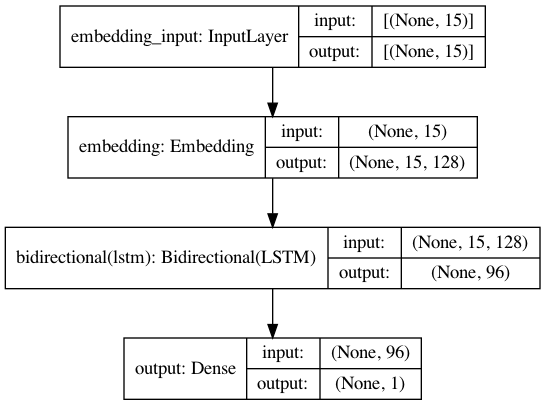

In [62]:
plot_model(models[0], show_shapes=True)

In [63]:
## Retrieve the summary of results from the tuner
tuner.results_summary()

## Explanation

### Train Model with the Tuned Hyperparameters

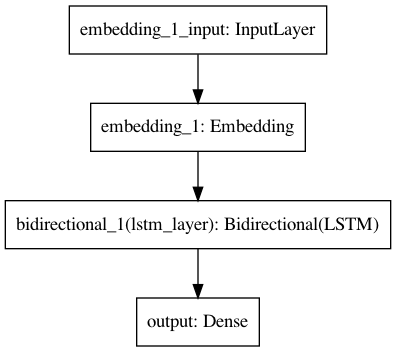

In [64]:
EMBEDDING_DIM = 128
HIDDEN_STATE= 48
model6 = Sequential()
model6.add(
    layers.Embedding(input_dim=vocab_size,
                     output_dim=EMBEDDING_DIM,
                     input_length=max_len,
                     mask_zero=True))
model6.add(
    layers.Bidirectional(
        layers.LSTM(HIDDEN_STATE,
                    activation="relu",
                    name="lstm_layer",
                    dropout=0.2,
                    recurrent_dropout=0.5)))
model6.add(layers.Dense(1, activation="sigmoid", name="output"))

model6.compile(loss=keras.losses.BinaryCrossentropy(),
               optimizer=keras.optimizers.Adam(lr=0.001),
               metrics=["accuracy"])
plot_model(model6)

In [65]:
history6 = model6.fit(X_train,
                      y_train,
                      batch_size=BATCH_SIZE,
                      epochs=EPOCHS,
                      verbose=2,
                      validation_split=VALIDATION_SPLIT)

Epoch 1/20
40/40 - 8s - loss: 0.6515 - accuracy: 0.6237 - val_loss: 0.6236 - val_accuracy: 0.6168
Epoch 2/20
40/40 - 2s - loss: 0.5493 - accuracy: 0.7089 - val_loss: 0.5125 - val_accuracy: 0.7506
Epoch 3/20
40/40 - 2s - loss: 0.4635 - accuracy: 0.7777 - val_loss: 0.4676 - val_accuracy: 0.7742
Epoch 4/20
40/40 - 1s - loss: 0.4366 - accuracy: 0.7868 - val_loss: 0.4569 - val_accuracy: 0.7797
Epoch 5/20
40/40 - 1s - loss: 0.4307 - accuracy: 0.7887 - val_loss: 0.4488 - val_accuracy: 0.7860
Epoch 6/20
40/40 - 1s - loss: 0.4234 - accuracy: 0.7972 - val_loss: 0.4429 - val_accuracy: 0.7978
Epoch 7/20
40/40 - 1s - loss: 0.4182 - accuracy: 0.8025 - val_loss: 0.4384 - val_accuracy: 0.7868
Epoch 8/20
40/40 - 1s - loss: 0.4134 - accuracy: 0.8017 - val_loss: 0.4306 - val_accuracy: 0.8017
Epoch 9/20
40/40 - 1s - loss: 0.4071 - accuracy: 0.8072 - val_loss: 0.4299 - val_accuracy: 0.8002
Epoch 10/20
40/40 - 1s - loss: 0.4040 - accuracy: 0.8086 - val_loss: 0.4279 - val_accuracy: 0.8033
Epoch 11/20
40/40 -

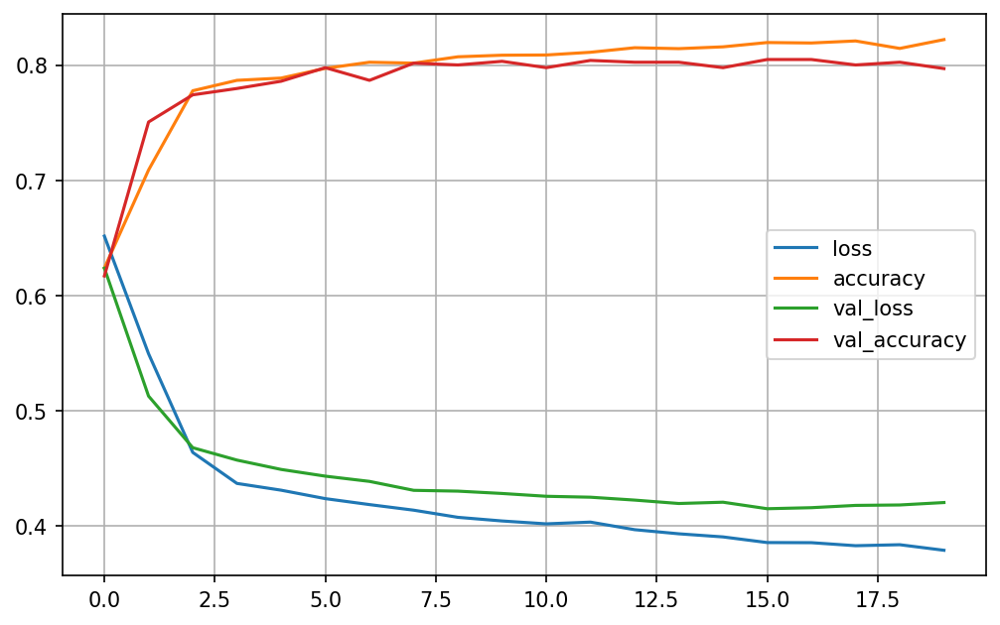

In [66]:
plot2(history6)

In [67]:
explainer = LimeTextExplainer(class_names=['male'], char_level=True)

In [68]:
def model_predict_pipeline(text):
    _seq = tokenizer.texts_to_sequences(text)
    _seq_pad = keras.preprocessing.sequence.pad_sequences(_seq, maxlen=max_len)
    #return np.array([[float(1-x), float(x)] for x in model.predict(np.array(_seq_pad))])
    return model6.predict(np.array(_seq_pad))

In [69]:
text_id = 12
print(X_test_texts[text_id])
model_predict_pipeline([X_test_texts[text_id]])

Hymie


array([[0.33566964]], dtype=float32)

In [70]:
exp = explainer.explain_instance(X_test_texts[text_id],
                                 model_predict_pipeline,
                                 num_features=100,
                                 top_labels=1)

In [71]:
exp.show_in_notebook(text=True)

In [72]:
y_test[text_id]

1

In [73]:
exp = explainer.explain_instance('Tim',
                                 model_predict_pipeline,
                                 num_features=100,
                                 top_labels=1)
exp.show_in_notebook(text=True)

In [74]:
exp = explainer.explain_instance('Michaelis',
                                 model_predict_pipeline,
                                 num_features=100,
                                 top_labels=1)
exp.show_in_notebook(text=True)

In [75]:
exp = explainer.explain_instance('Sidney',
                                 model_predict_pipeline,
                                 num_features=100,
                                 top_labels=1)
exp.show_in_notebook(text=True)

In [76]:
exp = explainer.explain_instance('Timber',
                                 model_predict_pipeline,
                                 num_features=100,
                                 top_labels=1)
exp.show_in_notebook(text=True)

In [77]:
exp = explainer.explain_instance('Alvin',
                                 model_predict_pipeline,
                                 num_features=100,
                                 top_labels=1)
exp.show_in_notebook(text=True)

## References

- Chollet (2017), Ch 3 and  Ch 4